<a href="https://colab.research.google.com/github/sackeyprince/background-generator/blob/master/Dog_Vision_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multi-class Dog Breed Classificaiton

This notebook builds and end-to-end multiclass image classifier using TensorFlow 2.0 and TensoFlow Hub.

## 1. Problem
Identifying the breed of a dog given the image.

## 2. Data
From Kaggle's Dog Breed Data Evaluation Competition:
https://www.kaggle.com/c/dog-breed-identification/data 

## 3. Evaluation
For each image in the test set, we must predict a probability for each of the different breeds. The file should contain a header and have the following format in the link below:

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features
Some information:
* We're dealing with images (unstructured data) therefore Deep Learning or Transfer Learning is preferable
* There are 120 breeds of dogs (120 different classes).
* There are around 10,000 images in the training set (these images have lables).
* There are around 10,000 images in the the test set (these images have no labels).



# Getting workspace ready

In [1]:
# Upload folder to Google Drive
# Unzip folder
# Import TensorFlow into Colab
# Import TensorFlow Hub
# Ensure we're using a GPU
import tensorflow as tf
import tensorflow_hub as hub
print('TF version:', tf.__version__)
print('TF Hub version:', hub.__version__)

# Check for GPU availability
print('GPU', 'available confirmation' if tf.config.list_physical_devices('GPU') else 'not avaialble')

TF version: 2.3.0
TF Hub version: 0.8.0
GPU available confirmation


# Next: Training a model on the full data
## Getting Data Ready (turning into Tensors)
With all machine learning models all images must be turned to Tensors and in numerical representations.


In [2]:
# Start by accessing data and checking labels
import pandas as pd
labels_csv = pd.read_csv('/content/drive/My Drive/Dog-Vision/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     4a50b85cdf5b3c300ed828bec3a45b10  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [3]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


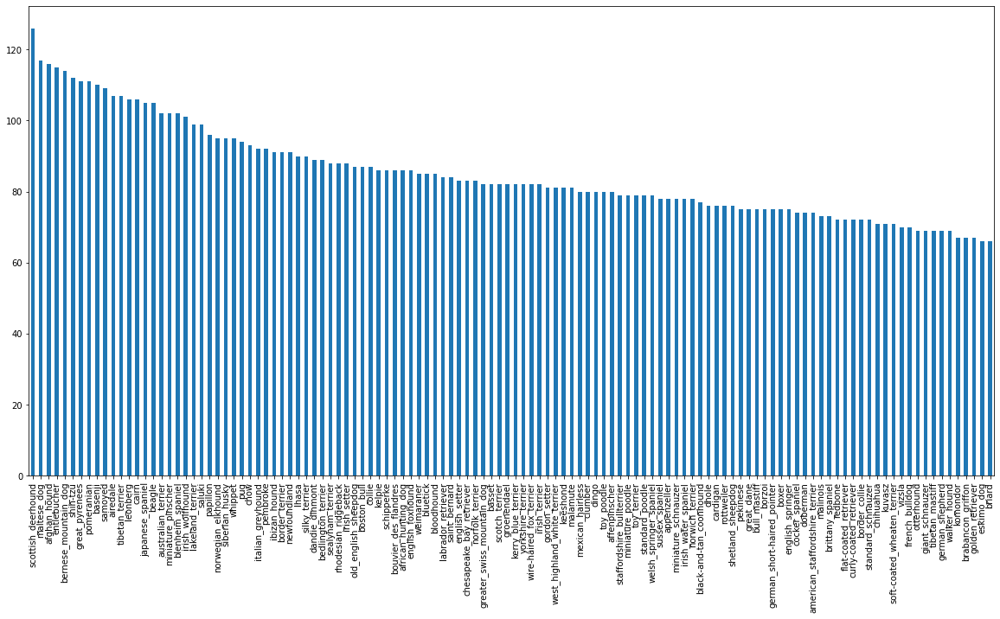

In [4]:
# How many images are there for each breed
labels_csv['breed'].value_counts().plot.bar(figsize = (20, 10))

In [5]:
labels_csv['breed'].value_counts().median()

82.0

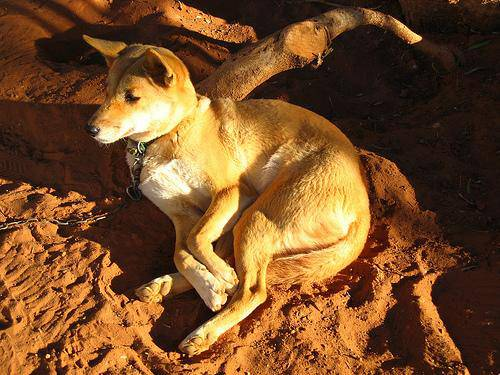

In [6]:
# Viewing an image
from IPython.display import Image
Image('/content/drive/My Drive/Dog-Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

### Getting images and their labels

Getting list of all image file path names

In [7]:
# Create path names from image IDs
filenames = ['/content/drive/My Drive/Dog-Vision/train/' + fname + '.jpg' for fname in labels_csv['id']]

# Check list of names
filenames[:10]

['/content/drive/My Drive/Dog-Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/My Drive/Dog-Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/My Drive/Dog-Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/My Drive/Dog-Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/My Drive/Dog-Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/My Drive/Dog-Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/My Drive/Dog-Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/My Drive/Dog-Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/My Drive/Dog-Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/My Drive/Dog-Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [8]:
import os
os.listdir('/content/drive/My Drive/Dog-Vision/train')[:10]

['eda840df78ede0c000cd97b337b3d0db.jpg',
 'f4045ccfa988393752a265e086979e6c.jpg',
 'ea43c69e5c1321a6d05d0caaceb69318.jpg',
 'ebb32c71dd92a3ad87d16006507fe779.jpg',
 'f6505af99611986f0141aa986e71e766.jpg',
 'ef0ca2e519acbcd5f7f03a97acdf0ef1.jpg',
 'eca1b1928e00e376ac39717ea933b57b.jpg',
 'f28efce22982ed7867a67df7d0762c58.jpg',
 'f1e4f7a6a490bd1bb2bfcb5586902e9e.jpg',
 'f6e186742c1885a3c4a66396195d8a18.jpg']

In [9]:
# Check if number of file names matches number of actual image files
import os 
if len(os.listdir('/content/drive/My Drive/Dog-Vision/train')) == len(filenames):
  print('Filenames match actual image files. Proceed')
else:
  print('Filenames does not match actual amount of files. check target directory.')

Filenames match actual image files. Proceed


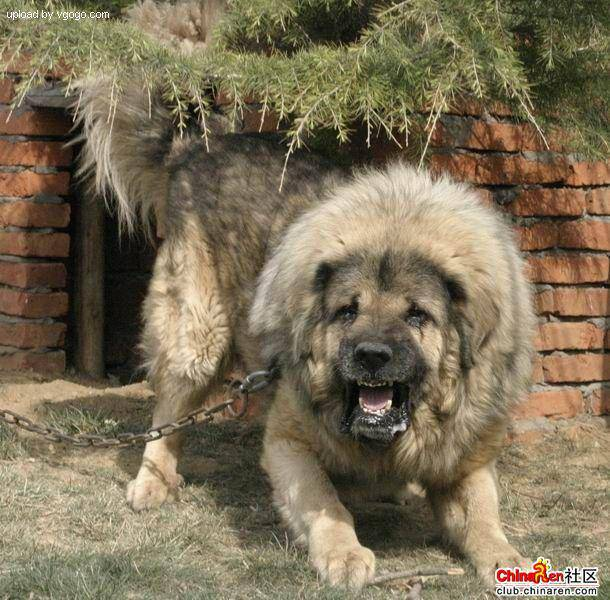

In [10]:
# Another check 
Image(filenames[9000])

In [11]:
labels_csv['breed'][9000]

'tibetan_mastiff'

In [12]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


As we've now got our training image filepaths in a list, we can prepare our labels

In [13]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
# labels = np.array(labels) # does same as above (.to_numpy())
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
len(labels)

10222

In [15]:
# Check if number f labels matches the number of filenames
if len(labels) == len(filenames):
  print('Number of labels matches number of filenames.')
else:
  print('Number of lables does not match number of filenames, check data directories.')

Number of labels matches number of filenames.


In [16]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [17]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds 

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [18]:
len(labels)

10222

In [19]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels [:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [20]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [21]:
print(labels[2])
print(boolean_labels[0].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating validation set
As dataset from Kaggle didn't come with validation set, we will recreate ours

In [22]:
# Set up x & y variables
x = filenames
y = boolean_labels

Commence by experimentin ~1,000 images and increase as needed

In [23]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [24]:
# Next is to split data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

In [25]:
len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [26]:
# Quick view of training data
x_train[:2], y_train[:2]

(['/content/drive/My Drive/Dog-Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/My Drive/Dog-Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, Fals

# Turning labels and videos into Tensors (Reprocessing images)

To preprocess images into Tensors, we write a function:
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable, 'image'.
3. Turn 'image' (a jpg) into Tensors
4. Resize the 'image' to be a shape of (224, 224)
5. Return modified 'image'

# First let's see what importing an image looks like.

In [27]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [28]:
# Turning image into Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we've seen what am image in Tensor looks like, let's make a function to preprocess them - as stated above:
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable, 'image'.
3. Turn 'image' (a jpg) into Tensors
4. Normalise our image (convert colour channel values from 0-255 to 0-1
5. Resize the 'image' to be a shape of (224, 224)
6. Return modified 'image'

In [29]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  '''
  Takes an image file path and turns the iimage into a Tensor.
  '''
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpg image into numerical Tensor with three colour channels (red, green, blue)
  image = tf.image.decode_jpeg(image, channels=3)
  #Convert the colour channel values from 0-255 to 0-1 valus
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

### Turning data into batches

Why turn data into batches?

For example, in processing around 10k images in one go, they might not fit in to the memory. This is why about 32 (batch size) images at a time is recommended. You can manually adjust the batch size if need be.

In order to use TensorFLow effectively, data needs to be in the from or Tensor tuples which looks like:
'(image, label)'



In [30]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):

  '''
  Takes image file path name and associated label,
  processes the image and returns a type of (image, label).
  '''
  image = process_image(image_path)
  return image, label


In [31]:
# Demo of the above
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

We can now turn our data into tuples of Tensors in the form '(image, label)', we can make a function to turn our data x & y into batches.

In [32]:
#Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Creates batches of data out of image (x) and label (y) pairs
  It shuffles the data if it's in training data but does not shuffle if it's validation data
  Also, accepts test data as input (no labels).
  '''
  # If the data is a test dataset, we may not have labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # Only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If data is a valid dataset, there may not be a need to shuffle it
  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print('Creating training data batches...') 
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y))) 
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples - turns image path into a preprocessed image
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    
  return data_batch


In [33]:
# Create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [34]:
# Checking out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualising Data Batches

Data is now in batches, to make it understandable, we can visualise them

In [35]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  '''
  Displays a plot of 25 images and their labels from a data bactch.
  '''
  # Set up figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for dispalying 25 images)
  for i in range(25):
    # Create subplots(5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis('off')


In [36]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[7.16299117e-02, 7.16299117e-02, 7.16299117e-02],
          [6.80934936e-02, 6.80934936e-02, 6.80934936e-02],
          [7.84313753e-02, 7.84313753e-02, 7.84313753e-02],
          ...,
          [1.95395812e-01, 1.95395812e-01, 1.95395812e-01],
          [1.88235313e-01, 1.88235313e-01, 1.88235313e-01],
          [1.88235313e-01, 1.88235313e-01, 1.88235313e-01]],
 
         [[7.86273107e-02, 7.86273107e-02, 7.86273107e-02],
          [6.74120486e-02, 6.74120486e-02, 6.74120486e-02],
          [7.42720589e-02, 7.42720589e-02, 7.42720589e-02],
          ...,
          [1.95685327e-01, 1.95685327e-01, 1.95685327e-01],
          [1.91561639e-01, 1.91561639e-01, 1.91561639e-01],
          [1.91561639e-01, 1.91561639e-01, 1.91561639e-01]],
 
         [[8.15743655e-02, 8.15743655e-02, 8.15743655e-02],
          [6.09170347e-02, 6.09170347e-02, 6.09170347e-02],
          [6.99329004e-02, 6.99329004e-02, 6.99329004e-02],
          ...,
          [1.95764571e-01, 1.95764571e-01, 1.9576

In [37]:
# Length of the images and labes from above 
len(train_images), len(train_labels)

(32, 32)

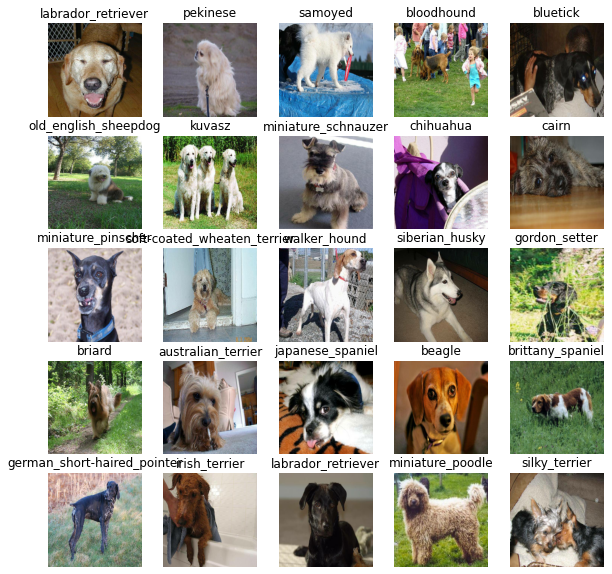

In [38]:
# To visualise the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

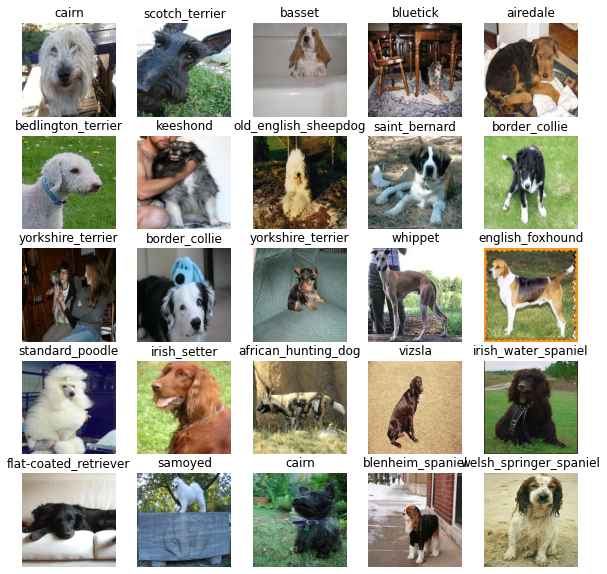

In [39]:
# We can now visualise our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model
Before building model, it is worth defining a few things:
* The input shape (images shape, in the form of Tensors) to our model.
* The output shape (images shape, in the form of Tensors) to our model.
* The URL of the model to be used from TensorFlow Hub: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4 

In [40]:
# Set up input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, heigh, width, colour channels

#Set up output shape to the model
OUTPUT_SHAPE = len(unique_breeds)

# Set up model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4'

As we now have our inputs, output and model ready to go, we can put them together into a Keras Deep Learning mode.

Knowing this, let's create a function which:
* Takes the input shape, output share and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says how it should evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www/tensorflow.org/guide/keras/overview

In [41]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with:', MODEL_URL)

  # Set up the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation='softmax') # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [42]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [43]:
outputs = np.ones(shape=(1, 1, 1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

### Creating Callbacks

Callbacks are helper functions a model can use during training to do such things as save progress, check progress or stop training early if a model stops improving. 

We will create two callbacks:
* One for TensorBoard which helps track our model's progress.
* Another for early stopping whcih prevents our model from training for too long.

### TensorBoard Callback

To set up TensorBoard call back we need:
1. Load the TensorBoard Notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's 'fit()' function.
3. Visualise our model's training logs with the '%tensorboard' magic function (after model training).

In [44]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [45]:
import datetime 

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard calls
  log_dir = os.path.join('/content/drive/My Drive/Dog-Vision/Logs',
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(log_dir)

### Early Stopping Callback

Early Stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving:
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping 

In [46]:
# Create Early Stopping Callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

### Training a model (a subset of data)

Our first model is going to train on 1,000 images to ensure everything is working.

In [47]:
NUM_EPOCHS = 100 #@param {type: 'slider', min:10, max:100, steps:10}

In [48]:
# Check to make sure we're still running on a GPU
print('GPU', 'available' if tf.config.list_physical_devices('GPU') else 'not available.')

GPU available


Creating a function with trains a model.

* Create model using 'create_model()'
* Set up TensorBoard callback using 'create_tensorboad_callback()'
* Call the 'fit()' funciton on our model by passing it training data, validation data, number of epochs (NUM_EPOCHS), and the callbacks we'll like to use.
* Return the model

In [49]:
# Build a function to train and return a trained model
def train_model():
  '''
  Trains a given model and returns the trained version.
  '''
  # Create a model
  model = create_model()
  
  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model


In [50]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
 1/25 [>.............................] - ETA: 0s - loss: 5.4779 - accuracy: 0.0000e+00WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


25/25 [==============================] - 616s 25s/step - loss: 4.5727 - accuracy: 0.0887 - val_loss: 3.5590 - val_accuracy: 0.2300
Epoch 2/100
25/25 [==============================] - 5s 197ms/step - loss: 1.6238 - accuracy: 0.6850 - val_loss: 2.3567 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 5s 194ms/step - loss: 0.5545 - accuracy: 0.9375 - val_loss: 1.8004 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 5s 194ms/step - loss: 0.2453 - accuracy: 0.9937 - val_loss: 1.6113 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 5s 193ms/step - loss: 0.1432 - accuracy: 0.9975 - val_loss: 1.5241 - val_accuracy: 0.6550
Epoch 6/100
25/25 [==============================] - 5s 194ms/step - loss: 0.0991 - accuracy: 1.0000 - val_loss: 1.4588 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================] - 5s 194ms/step - loss: 0.0760 - accuracy: 1.0000 - val_loss: 1.4408 - val_accuracy: 0.6700
Epoch 8/100

### Checking the TensorBoard logs
The TensorBoard magic function ('%tensorboard') will access the logs directly we created earlier and visualise it's contents.

In [51]:
%tensorboard --logdir /content/drive/My\ Drive/Dog-Vision/Logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [52]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 129ms/step


array([[2.8430405e-03, 3.0368759e-04, 5.8459071e-04, ..., 1.6275467e-04,
        9.8210603e-06, 5.9823301e-03],
       [1.0682414e-03, 2.7356369e-03, 9.7096516e-03, ..., 1.3197048e-03,
        1.5368306e-03, 3.0826570e-05],
       [3.2614415e-05, 6.5321714e-04, 3.5602783e-04, ..., 8.9954563e-05,
        6.5197737e-04, 1.2227475e-02],
       ...,
       [9.1810925e-06, 3.4565481e-05, 5.0456897e-06, ..., 4.5722459e-06,
        2.2196971e-05, 2.6666230e-05],
       [9.2980289e-04, 7.6028686e-05, 7.9955287e-05, ..., 8.8384775e-05,
        7.1544873e-06, 6.9133770e-03],
       [2.7083934e-05, 5.0996845e-05, 4.9196248e-04, ..., 1.3886329e-03,
        4.3885788e-04, 1.2524755e-05]], dtype=float32)

In [53]:
np.sum(predictions[0])

1.0000001

In [54]:
# First prediction
index = 0
print(predictions[0])
print(f'Max value (probability): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[2.8430405e-03 3.0368759e-04 5.8459071e-04 3.1566979e-05 2.2253236e-04
 2.1458247e-05 2.8636249e-02 3.6743868e-04 2.9946987e-05 4.1849809e-04
 1.6945150e-03 1.1535286e-04 4.0375724e-04 1.9987441e-05 4.8313415e-04
 3.7816542e-04 6.7207602e-06 2.8625751e-01 1.5565403e-05 2.7111580e-04
 3.8093590e-04 9.5147780e-06 1.7347960e-05 1.0300627e-03 1.0794634e-04
 2.1842743e-04 1.3705516e-01 1.5083492e-04 2.7742711e-04 9.1133770e-05
 7.7835044e-05 1.3829741e-03 1.3835520e-03 2.4739567e-05 4.4449967e-05
 4.6518523e-02 1.7055729e-05 1.6477646e-04 5.4495224e-05 5.8597354e-05
 3.0335006e-03 9.5133710e-06 7.0943788e-05 1.2261607e-04 2.2881408e-05
 1.5551763e-04 2.2951495e-05 3.4011234e-04 5.3831883e-04 1.5817505e-04
 2.2152437e-04 1.2769328e-05 9.4778232e-05 4.9625371e-05 1.4550141e-04
 5.3376807e-05 8.2658097e-04 1.7241891e-03 5.8896170e-04 5.8524460e-02
 7.6295219e-05 1.2502157e-05 8.8498223e-04 7.1849877e-06 2.5345664e-04
 7.8218415e-02 8.2104329e-05 8.7118213e-04 4.1805618e-03 1.0089735e-04
 5.630

Having the above functionality is ideal however it is prefreable to do it at scale, and see the image the prediction is being made on

** Note: Prediction probabilities are also know as 'Confidence Levels.'

In [55]:
# Turn prediction probabilities into their respective label (for ease in understanding)
def get_pred_label(prediction_probabilities):
  '''
  Turns an array of prediciton probabilities into a label
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

  # Get a predicted label based on an array of prediction probabilities 
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

As our validation data is in a batch dataset, we can 'unbatch' it to make predictions on the validation images and make predicitons on the validation labels (truth labels).

In [56]:
# Create a function to 'unbatch' a batch dataset
def unbatchify(data):
  '''
  Takes a batched dataset of (image, label, Tensors) and returns separate arrays of images and labels.
  '''
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [57]:
# Create a function to 'unbatch' a batch dataset
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)
  
images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Creating more visualisation for:
* Prediction Labels
* Validation Labels (truth labels)
* Validation images 

Creating a function which takes an array of the above.
Converting the prediction probabilities to a predicted label
Plot the predicted label, it's predicted probablity, the truth label and the target image on a single plot


In [58]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  '''
  View the prediction, ground truth, and image for sample n.
  '''
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image  and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                 np.max(pred_prob)*100,
                                 true_label),
                                 color=color)

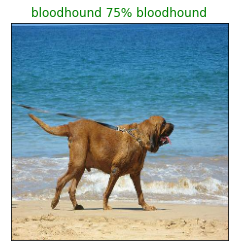

In [59]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=100)

As we now have a function to visualisation function, we can make a function to view our model's Top 10 Predicitons.

The model will:
* Take an input of prediction probabilities array and a ground truth array, and an integer
* Find the predicted label using 'get_pred_label()'
* Find the Top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the Top 10 Prediction Probability values and labels, and colouring the true label green.

In [60]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  '''
  Plot the Top 10 highest prediction confidences along with the truth label for sample n.
  '''
  pred_prob, true_label = prediction_probabilities[n], labels[n],

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the Top 10 Prediction Confidence Indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the Top 10 Prediction Confidence Values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the Top 10 Prediction Labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Set up plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                    top_10_pred_values,
                    color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')
  
  # Change the colour of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass



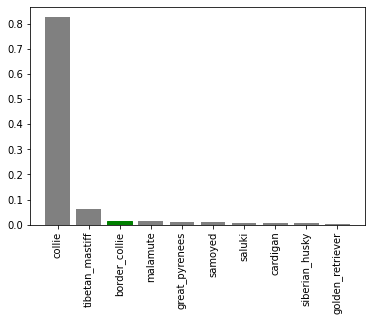

In [61]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

As we now have some functions to visualise our predictions, and evaluate our model, we can check out a few predictions and their different values

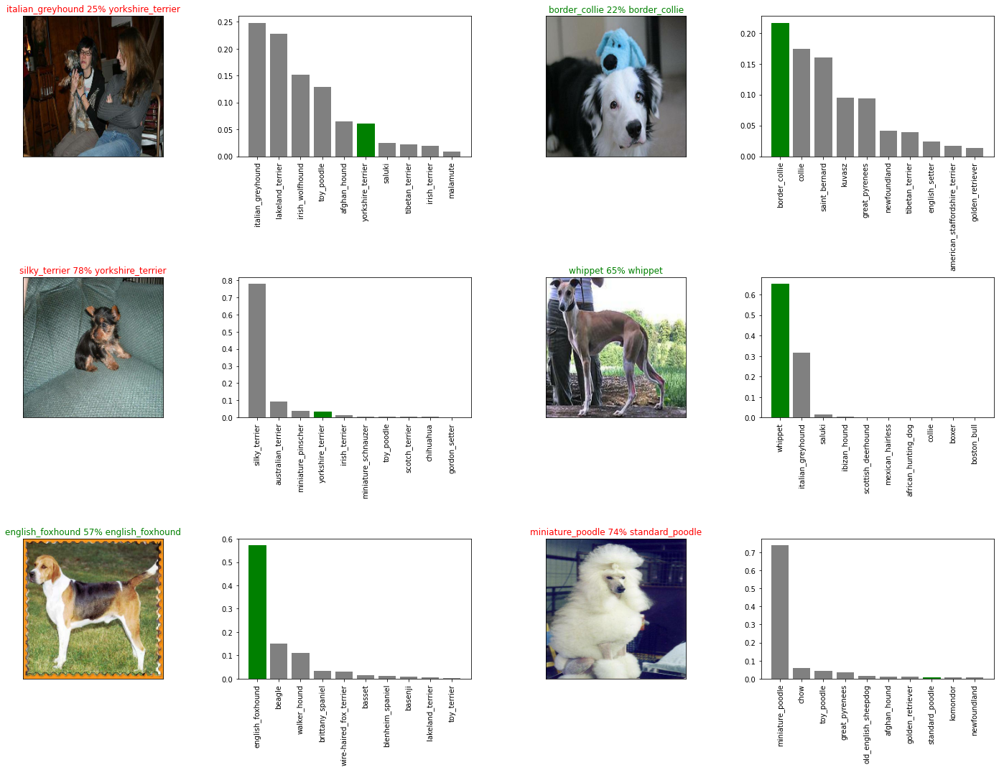

In [62]:
# Predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)

plt.show()


## Saving and reloading a trained model

In [63]:
# Create a function to save a model
def save_model(model, suffix=None):
  '''
  Saves a given model in a model's directory and appends a suffix (string).
  '''
  # Create model directory path name with current time
  modeldir = os.path.join('/content/drive/My Drive/Dog-Vision/Models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = modeldir + '-' + suffix + '.h5' # save format of model
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  return model_path

In [64]:
# Create function to load a model
def load_model(model_path):
  '''
  Loads a saved model from a specified path.
  '''
  print(f'Loading saved model from: {model_path}')
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={'KerasLayer':hub.KerasLayer})
  return model

Check if the functions to 'Save' and 'Load' models work

In [65]:
# Save model trained on 1000 images
save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to: /content/drive/My Drive/Dog-Vision/Models/20200806-12141596716048-1000-images-mobilenetv2-Adam.h5...


'/content/drive/My Drive/Dog-Vision/Models/20200806-12141596716048-1000-images-mobilenetv2-Adam.h5'

In [66]:
# Load a trained model
loaded_1000_image_model = load_model('/content/drive/My Drive/Dog-Vision/Models/20200710-15091594393759-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/My Drive/Dog-Vision/Models/20200710-15091594393759-1000-images-mobilenetv2-Adam.h5


In [67]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 124ms/step - loss: 1.2884 - accuracy: 0.7200


[1.2884092330932617, 0.7200000286102295]

In [68]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 139ms/step - loss: 1.2758 - accuracy: 0.6900


[1.27577805519104, 0.6899999976158142]

# Training model on the full dataset of the Dog Vision

In [69]:
# Create a databatch with the full dataset
full_data = create_data_batches(x, y)

Creating training data batches...


In [70]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [71]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [72]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data; therefore we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

*** Note that running cell below can take up to 30 mins for the first epoch as it is training on all the data ad the GPU we're using has to load the images to memory

In [73]:
# Fit the full model to the full dta
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 7208s 23s/step - loss: 1.3730 - accuracy: 0.6603
Epoch 2/100
320/320 [==============================] - 50s 155ms/step - loss: 0.4057 - accuracy: 0.8802
Epoch 3/100
320/320 [==============================] - 50s 155ms/step - loss: 0.2392 - accuracy: 0.9347
Epoch 4/100
320/320 [==============================] - 50s 155ms/step - loss: 0.1579 - accuracy: 0.9626
Epoch 5/100
320/320 [==============================] - 49s 154ms/step - loss: 0.1073 - accuracy: 0.9788
Epoch 6/100
320/320 [==============================] - 51s 158ms/step - loss: 0.0780 - accuracy: 0.9869
Epoch 7/100
320/320 [==============================] - 49s 154ms/step - loss: 0.0594 - accuracy: 0.9927
Epoch 8/100
320/320 [==============================] - 49s 154ms/step - loss: 0.0458 - accuracy: 0.9949
Epoch 9/100
320/320 [==============================] - 49s 153ms/step - loss: 0.0375 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 49s 153m

In [74]:
save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')

Saving model to: /content/drive/My Drive/Dog-Vision/Models/20200806-14281596724096-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/My Drive/Dog-Vision/Models/20200806-14281596724096-full-image-set-mobilenetv2-Adam.h5'

In [75]:
# Loading the full model
loaded_full_model = load_model('/content/drive/My Drive/Dog-Vision/Models/20200710-17471594403267-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/My Drive/Dog-Vision/Models/20200710-17471594403267-full-image-set-mobilenetv2-Adam.h5


## Making Predictions on the Test Dataset

As our model has been trained on images in the form of Tensor batches, to make predictions we have to get it in the same format.

We can use 'create_data_batches()' function we have created which can take a list of filenames as input and convert them into Tensor batches.

To make the predictions:
* Get the test image filenames
* Convert the filenames into test data batches using 'create_data_batches()' and setting the 'test_data' parameter to 'True' (since the test data does not have labels.
* Make a predicitons array by passing the test batches to the 'predict()' method called on our model

In [79]:
# Loard test image file names
test_path = '/content/drive/My Drive/Dog-Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/My Drive/Dog-Vision/test/eec15026b5af233fa79dfb6081e1f339.jpg',
 '/content/drive/My Drive/Dog-Vision/test/ebbbbe14c3e968a8f73490d024472768.jpg',
 '/content/drive/My Drive/Dog-Vision/test/e864f3fc5d19aec4b7a5aa547b359c57.jpg',
 '/content/drive/My Drive/Dog-Vision/test/f1167eabf53759dad015f0abb813a451.jpg',
 '/content/drive/My Drive/Dog-Vision/test/eb641b6721c3d967b8e92313c943eba9.jpg',
 '/content/drive/My Drive/Dog-Vision/test/e9615e7f30ffcf6d705ce9cbcb6d688c.jpg',
 '/content/drive/My Drive/Dog-Vision/test/ea1f200df74cd6c6a458436eedabbc8d.jpg',
 '/content/drive/My Drive/Dog-Vision/test/f16eed64196d24c423f0a68d7ebf287d.jpg',
 '/content/drive/My Drive/Dog-Vision/test/e92e6f99e804a6696cf0db266bbd7744.jpg',
 '/content/drive/My Drive/Dog-Vision/test/f3fa4a19ad6e0a8a4b25467fb995fd7a.jpg']

In [80]:
len(test_filenames)

10357

In [81]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [82]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**Note:** Calling 'predict()' on our full model and passing it the test data batch will take a long time to run ( ~1hr)

In [83]:
# Make predictions on test data batch using loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 7657s 24s/step


In [86]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt('/content/drive/My Drive/Dog-Vision/preds_array.csv', test_predictions, delimiter=',')

In [88]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("/content/drive/My Drive/Dog-Vision/preds_array.csv", delimiter=",")

In [89]:
test_predictions[:10]

array([[4.48178473e-12, 8.40155202e-12, 9.86959403e-10, ...,
        2.15109744e-12, 1.73019862e-10, 6.91483069e-12],
       [3.58338355e-07, 2.90707277e-07, 1.65137255e-08, ...,
        1.42249871e-06, 6.58699628e-06, 2.10209657e-03],
       [2.49516120e-07, 3.28060651e-07, 9.28512735e-12, ...,
        4.66893324e-09, 4.61853819e-12, 3.47930407e-10],
       ...,
       [3.76247341e-12, 8.46865425e-11, 3.05810065e-11, ...,
        6.39638564e-09, 1.20304591e-07, 1.51070337e-10],
       [6.45874812e-11, 2.02093133e-08, 1.07526539e-08, ...,
        1.42351269e-07, 2.05661777e-07, 1.10125335e-07],
       [1.26722206e-08, 1.10286655e-05, 3.31322036e-09, ...,
        3.89745480e-09, 3.96914890e-10, 3.26915341e-07]])

In [90]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our model's prediciton probability outputs in a DataFrame with an ID and a column for each different dog breed: 
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we will:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submite to Kaggle.

In [91]:
# ['id'] + list(unique_breeds)

In [92]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [93]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path) [0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids


In [94]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,eec15026b5af233fa79dfb6081e1f339,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ebbbbe14c3e968a8f73490d024472768,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e864f3fc5d19aec4b7a5aa547b359c57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f1167eabf53759dad015f0abb813a451,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,eb641b6721c3d967b8e92313c943eba9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [95]:
# Add the prediction probabilities to each dog column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,eec15026b5af233fa79dfb6081e1f339,4.48178e-12,8.40155e-12,9.86959e-10,1.23452e-11,5.65311e-12,5.50763e-07,8.16334e-09,3.63775e-10,3.81257e-11,2.95577e-10,8.21001e-12,3.41553e-09,1.12179e-06,9.75677e-13,7.00077e-09,5.99043e-12,1.43165e-09,3.2003e-11,9.6032e-13,1.16088e-10,2.71138e-13,1.20698e-12,2.46829e-09,9.41674e-12,4.5056e-12,1.0173e-12,2.18627e-12,5.78451e-09,1.23727e-09,2.22364e-08,4.80587e-11,6.92675e-13,1.71471e-12,2.89662e-12,2.15531e-13,2.02322e-13,1.54267e-07,6.43071e-08,3.50572e-08,...,2.0608e-07,2.56028e-09,3.01308e-13,5.46778e-13,7.84951e-09,6.40266e-13,1.02431e-06,2.02184e-10,4.38478e-13,9.52687e-08,1.03515e-11,1.76398e-07,2.45213e-12,6.74547e-11,8.67661e-10,9.08437e-07,4.15104e-10,1.00537e-13,1.76611e-13,1.36595e-12,1.01065e-12,5.3809e-10,3.9025e-08,2.96404e-11,4.74506e-10,1.14576e-10,1.34216e-11,1.37398e-11,4.53357e-10,1.63527e-09,4.24636e-11,2.92459e-06,2.11852e-11,9.20701e-12,4.65314e-11,3.37276e-13,8.22762e-11,2.1511e-12,1.7302e-10,6.91483e-12
1,ebbbbe14c3e968a8f73490d024472768,3.58338e-07,2.90707e-07,1.65137e-08,6.70107e-09,1.10387e-06,3.79789e-09,0.856404,1.2701e-05,1.41632e-09,2.06173e-09,7.05905e-10,2.09674e-07,2.90207e-06,3.9524e-06,1.04827e-06,4.87574e-07,0.000125617,2.5014e-08,8.32087e-09,3.90405e-07,2.59892e-09,7.87703e-08,5.82044e-07,2.05515e-06,7.41756e-07,6.19855e-10,2.22355e-06,8.53474e-05,2.49028e-08,8.40667e-05,6.43443e-07,1.43561e-08,4.12255e-07,1.22718e-07,1.30963e-11,1.09649e-07,7.96993e-06,2.11549e-09,4.99258e-07,...,9.20211e-06,0.00059054,8.78277e-08,2.82136e-07,0.00361556,6.74513e-06,1.05095e-06,2.7725e-05,3.01889e-08,1.77713e-06,1.44952e-08,1.90082e-09,8.81689e-11,2.48116e-10,7.3899e-07,2.76363e-06,0.000929402,1.94857e-06,7.22091e-08,9.40978e-07,2.81762e-07,4.6941e-08,0.0490522,7.55827e-09,6.45759e-07,1.65457e-07,1.88463e-07,1.95376e-07,5.22197e-09,1.51388e-07,0.000464418,2.62163e-05,3.66292e-06,3.07916e-06,2.28763e-06,2.45805e-08,1.40652e-06,1.4225e-06,6.587e-06,0.0021021
2,e864f3fc5d19aec4b7a5aa547b359c57,2.49516e-07,3.28061e-07,9.28513e-12,2.85114e-10,7.06308e-12,2.64404e-11,1.03436e-09,3.00933e-10,2.95336e-12,1.93679e-14,3.94961e-08,1.98341e-11,6.64921e-10,7.11021e-08,4.63619e-11,2.14217e-11,1.96136e-10,2.3019e-10,2.53426e-10,2.84804e-09,3.26878e-07,1.05303e-11,6.00676e-09,1.23183e-09,2.50062e-10,4.86006e-10,5.20218e-09,1.64546e-10,6.74805e-09,2.70579e-13,2.48193e-09,1.41151e-09,4.6099e-09,2.45791e-11,2.24175e-10,7.56554e-11,1.84301e-10,1.53696e-09,9.22002e-10,...,1.50075e-09,3.14512e-07,2.55928e-07,2.22342e-06,2.02919e-11,1.32931e-10,4.29467e-14,2.15751e-11,1.63293e-10,4.07553e-08,2.76609e-10,6.39395e-11,1.1685e-11,7.97908e-10,3.06201e-09,1.13489e-09,2.06933e-11,1.63907e-07,3.53857e-10,4.1379e-11,2.50776e-10,1.05078e-09,1.32296e-11,2.12531e-08,1.3206e-11,1.00531e-06,1.2369e-07,2.54915e-08,4.84861e-09,0.000101964,1.49816e-08,6.97101e-12,1.95986e-12,5.15111e-09,8.0755e-10,4.91138e-10,1.38925e-12,

In [96]:
# Export to CSV for submission to Kaggle
preds_df.to_csv('/content/drive/My Drive/Dog-Vision/full_model_predictions_submission_1_mobilenetV2.csv',
                index=False)

## Making Predictions on Custom Images

To make predicitons on custom images:
* Get the filepaths of own images
* Turn the filepaths into data batches using 'create_data_batches()'. And since our custom images won't have labels, we set the 'test_data' parameter to 'True'.
* Pass thecustom image data batch to our model's 'predict()' method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images

In [97]:
# Get custom image filepaths
custom_path = '/content/drive/My Drive/Dog-Vision/custom-dog-photos/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [98]:
custom_image_paths

['/content/drive/My Drive/Dog-Vision/custom-dog-photos/brown-and-white-short-coated-puppy-1805164.jpg',
 '/content/drive/My Drive/Dog-Vision/custom-dog-photos/dog-snout-puppy-royalty-free-97082.jpg',
 '/content/drive/My Drive/Dog-Vision/custom-dog-photos/animal-dog-pet-cute-2007.jpg',
 '/content/drive/My Drive/Dog-Vision/custom-dog-photos/photo-of-white-and-brown-coated-dog-2820134.jpg']

In [99]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [100]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [101]:
custom_preds.shape

(4, 120)

In [102]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['chow', 'weimaraner', 'boxer', 'collie']

In [103]:
# Get custom images (unbatchify() function won't work as there aren't labels.)
custom_images = []
# Loop through unbatched data
for images in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

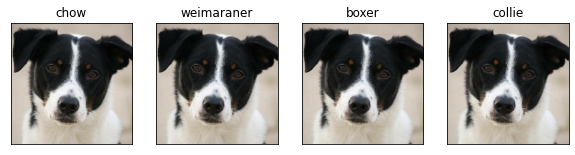

In [104]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 4, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)